# Simulation
Simulation according to the paper "Talent versus Luck: The Role of Randomness in Success and Failure" by Alessandro Pluchino, Alessio Emanuele Biondo, and Andrea Rapisarda.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import pandas as pd

In [3]:
# Parameters
num_agents = 100
grid_size = 20
initial_wealth = 10 # or capital
mean_talent = 0.6
std_talent = 0.1
num_lucky_events = 25
num_unlucky_events = 25
num_steps = 80 # 40 years of career multiplied by 2 (6 month steps for event points)

In [4]:
# Data collection lists
capital_changes = []
event_types = []
talent_values = []

In [5]:
# Generate talents
talents = np.random.normal(mean_talent, std_talent, num_agents)
talents = np.clip(talents, 0, 1)

# starting capital
capitals = np.full(num_agents, initial_wealth)

Text(0.5, 1.0, 'Normal Distribution of Talent')

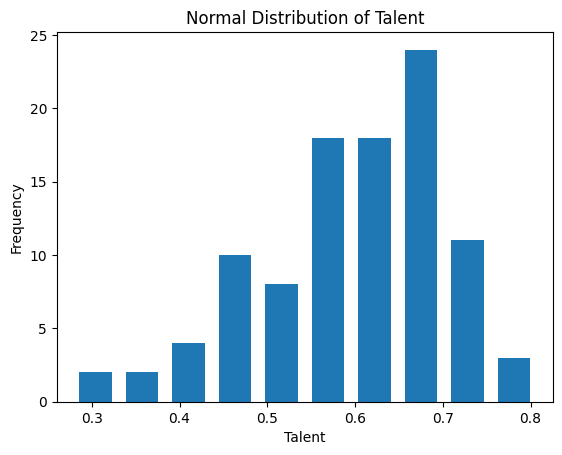

In [6]:
# plot of variable distribution
plt.hist(talents, rwidth=0.7)  
plt.ylabel('Frequency')
plt.xlabel('Talent')
plt.title('Normal Distribution of Talent')

In [7]:
x_m, alpha = 1, 3.
#drawing samples from distribution
success = (np.random.pareto(alpha, 1000) + 1) * x_m

Text(0.5, 1.0, 'Pareto Distribution of Success')

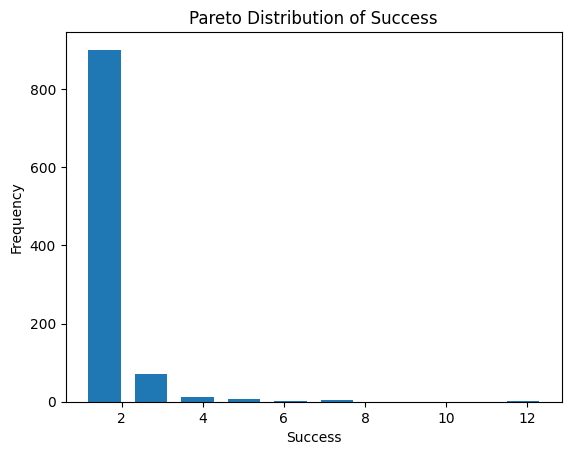

In [8]:
plt.hist(success, rwidth=0.7)  
plt.ylabel('Frequency')
plt.xlabel('Success')
plt.title('Pareto Distribution of Success')

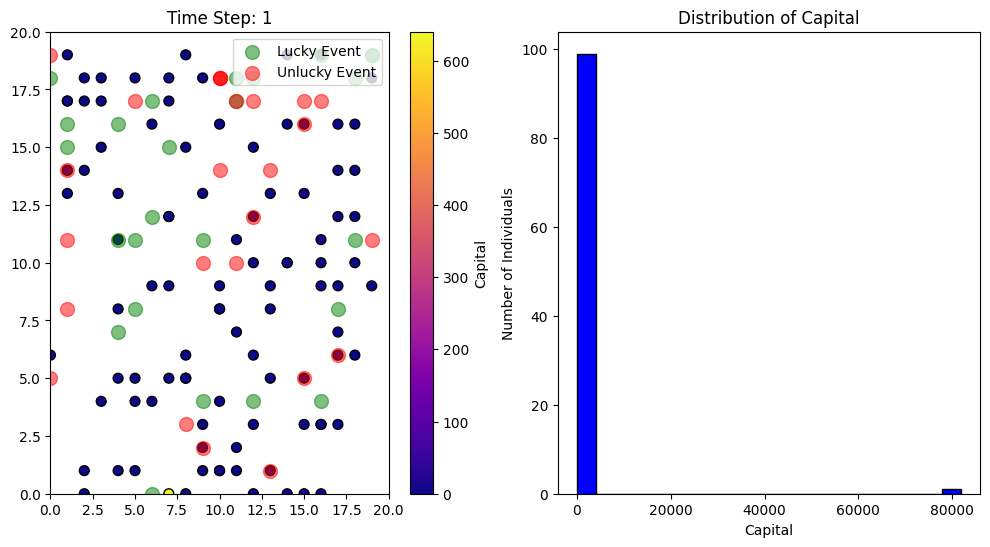

In [11]:
# Initialize positions
positions = np.random.randint(0, grid_size, (num_agents, 2))

# Create figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.set_xlim(0, grid_size)
ax1.set_ylim(0, grid_size)
ax2.set_xlim(0, initial_wealth * 10)  # Adjust the x-axis limit as needed

# Create a single colorbar
sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(vmin=capitals.min(), vmax=capitals.max()))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax1, orientation='vertical')
cbar.set_label('Capital')

# Function to update the simulation
def update(frame):
    global positions, capitals

    # Generate random event points
    lucky_events = np.random.randint(0, grid_size, (num_lucky_events, 2))
    unlucky_events = np.random.randint(0, grid_size, (num_unlucky_events, 2))

    # Check for lucky events
    for event in lucky_events:
        for i, pos in enumerate(positions):
            if np.array_equal(event, pos):
                if np.random.rand() < talents[i]:
                    capital_change = capitals[i] * 2 - capitals[i]
                    capitals[i] *= 2
                    capital_changes.append(capital_change)
                    event_types.append('lucky')
                    talent_values.append(talents[i])

    # Check for unlucky events
    for event in unlucky_events:
        for i, pos in enumerate(positions):
            if np.array_equal(event, pos):
                capital_change = capitals[i]/2 - capitals[i]
                capitals[i] /= 2
                capital_changes.append(capital_change)
                event_types.append('unlucky')
                talent_values.append(talents[i])

    # Update colors based on capitals
    normalized_capitals = (capitals - capitals.min()) / (capitals.max() - capitals.min())
    colors = plt.cm.plasma(normalized_capitals)

    # Clear previous plots
    ax1.clear()
    ax2.clear()

    # Update scatter plot
    scat_agents = ax1.scatter(positions[:, 0], positions[:, 1], c=colors, s=50, edgecolor='k')

    # Plot event points
    ax1.scatter(lucky_events[:, 0], lucky_events[:, 1], c='green', s=100, alpha=0.5, label='Lucky Event')
    ax1.scatter(unlucky_events[:, 0], unlucky_events[:, 1], c='red', s=100, alpha=0.5, label='Unlucky Event')

    # Update plot limits and title
    ax1.set_xlim(0, grid_size)
    ax1.set_ylim(0, grid_size)
    ax1.set_title(f'Time Step: {frame + 1}')

    # Update legend
    handles, labels = ax1.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax1.legend(by_label.values(), by_label.keys(), loc='upper right')

    # Plot histogram of capitals
    ax2.hist(capitals, bins=20, color='blue', edgecolor='black')
    ax2.set_title('Distribution of Capital')
    ax2.set_xlabel('Capital')
    ax2.set_ylabel('Number of Individuals')

# Create animation and keep a reference to it
ani = animation.FuncAnimation(fig, update, frames=num_steps, repeat=False, interval=500)
ani.save('../results/simulation.mp4', writer="ffmpeg")

# Display animation in Jupyter notebook
HTML(ani.to_jshtml())


In [10]:
# Convert collected data to a DataFrame
event_data = pd.DataFrame({
    'capital_change': capital_changes,
    'event_type': event_types,
    'talent_value': talent_values
})

# Save the data for later analysis
event_data.to_csv('data_simulation.csv', index=False)